![Getting Started](Capture.PNG)

#                                       Rental Pricing Dataset, Malaysia 

### `This is Supervised Task (Regression) & Evaluation Metric RMSE`

###  About Dataset

Context

This dataset contains information on rent pricing surrounding Kuala Lumpur and Selangor region, Malaysia. The information was scraped from mudah.my

### About the project
- This is a machine learning project to predict unit/property monthly rent price in Kuala Lumpur region, Malaysia. The project uses a dataset from an online ads listing for property mudah.my.

- This project aims to answers question about how much a unit monthly rent would be if given information such as location, number of bedrooms, parking, furnished, etc? This would help potential tenant and also the owner to get the best price of their rental unit, comparable to the market value. 


### Content

There are 13 features with one unique ids (ads_id) and one target feature (monthly_rent)

- ads_id: the listing ids (unique)
- prop_name: name of the building/ property
- completion_year: completion/ established year of the property
- monthly_rent: monthly rent in ringgit malaysia (RM)
- location: property location in Kuala Lumpur region
- property_type:property type such as apartment, condominium, flat, duplex, studio, etc
- rooms: number of rooms in the unit
- parking: number of parking space for the unit
- bathroom: number of bathrooms in the unit
- size: total area of the unit in square feet
- furnished: furnishing status of the unit (fully, partial, non-furnished)
- facilities: main facilities available
- additional_facilities: additional facilities (proximity to attraction area, mall, school, shopping, railways, etc)
- Acknowledgements
The data was scraped from mudah.my

- Inspiration
I have been living in Kuala Lumpur, Malaysia since 2017, and in the past there was no easy way to understand whether certain unit pricing is making sense or not. With this dataset, I wanted to be able to answer the following questions:

- What are the biggest factor affecting the unit/rent pricing?
Which location in Kuala Lumpur/ Selangor region that has the highest rent price?
etc?

### `Import Libraries`


In [289]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import missingno
import plotly.express as px
import regex
import plotly.graph_objects as go
## scopndary
from datasist.structdata import detect_outliers
from geopy.distance import geodesic

## sklearn -- preprocessing
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder, PolynomialFeatures
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline, FeatureUnion
from sklearn_features.transformers import DataFrameSelector

## sklearn -- metrics
from sklearn.metrics import mean_squared_error

## sklearn -- models
from sklearn.linear_model import LinearRegression, SGDRegressor, Ridge, Lasso, ElasticNet



###  <span style='color:green '> Step01>>__ Load the dataset And Data Understanding </span>

In [290]:
TRAIN_PATH = os.path.join(os.getcwd(),'mudah-apartment-kl-selangor.csv')
df = pd.read_csv(TRAIN_PATH)
df.head()

,ads_id,prop_name,completion_year,monthly_rent,location,property_type,rooms,parking,bathroom,size,furnished,facilities,additional_facilities,region
0,100323185,The Hipster @ Taman Desa,2022.0,RM 4 200 per month,Kuala Lumpur - Taman Desa,Condominium,5,2.0,6.0,1842 sq.ft.,Fully Furnished,"Minimart, Gymnasium, Security, Playground, Swi...","Air-Cond, Cooking Allowed, Washing Machine",Kuala Lumpur
1,100203973,Segar Courts,NaN,RM 2 300 per month,Kuala Lumpur - Cheras,Condominium,3,1.0,2.0,1170 sq.ft.,Partially Furnished,"Playground, Parking, Barbeque area, Security, ...","Air-Cond, Cooking Allowed, Near KTM/LRT",Kuala Lumpur
2,100323128,Pangsapuri Teratak Muhibbah 2,NaN,RM 1 000 per month,Kuala Lumpur - Taman Desa,Apartment,3,NaN,2.0,650 sq.ft.,Fully Furnished,"Minimart, Jogging Track, Lift, Swimming Pool",NaN,Kuala Lumpur
3,100191767,Sentul Point Suite Apartment,2020.0,RM 1 700 per month,Kuala Lumpur - Sentul,Apartment,2,1.0,2.0,743 sq.ft.,Partially Furnished,"Parking, Playground, Swimming Pool, Squash Cou...","Cooking Allowed, Near KTM/LRT, Washing Machine",Kuala Lumpur
4,97022692,Arte Mont Kiara,NaN,RM 1 299 per month,Kuala Lumpur - Mont Kiara,Service Residence,1,1.0,1.0,494 sq.ft.,Not Furnished,"Parking, Security, Lift, Swimming Pool, Playgr...",Air-Cond,Kuala Lumpur


In [291]:
## Create working datafram as a deep copy
df2= df.copy(deep = True)
df2.drop(['ads_id'], axis=1, inplace=True)
df2.head()

,prop_name,completion_year,monthly_rent,location,property_type,rooms,parking,bathroom,size,furnished,facilities,additional_facilities,region
0,The Hipster @ Taman Desa,2022.0,RM 4 200 per month,Kuala Lumpur - Taman Desa,Condominium,5,2.0,6.0,1842 sq.ft.,Fully Furnished,"Minimart, Gymnasium, Security, Playground, Swi...","Air-Cond, Cooking Allowed, Washing Machine",Kuala Lumpur
1,Segar Courts,NaN,RM 2 300 per month,Kuala Lumpur - Cheras,Condominium,3,1.0,2.0,1170 sq.ft.,Partially Furnished,"Playground, Parking, Barbeque area, Security, ...","Air-Cond, Cooking Allowed, Near KTM/LRT",Kuala Lumpur
2,Pangsapuri Teratak Muhibbah 2,NaN,RM 1 000 per month,Kuala Lumpur - Taman Desa,Apartment,3,NaN,2.0,650 sq.ft.,Fully Furnished,"Minimart, Jogging Track, Lift, Swimming Pool",NaN,Kuala Lumpur
3,Sentul Point Suite Apartment,2020.0,RM 1 700 per month,Kuala Lumpur - Sentul,Apartment,2,1.0,2.0,743 sq.ft.,Partially Furnished,"Parking, Playground, Swimming Pool, Squash Cou...","Cooking Allowed, Near KTM/LRT, Washing Machine",Kuala Lumpur
4,Arte Mont Kiara,NaN,RM 1 299 per month,Kuala Lumpur - Mont Kiara,Service Residence,1,1.0,1.0,494 sq.ft.,Not Furnished,"Parking, Security, Lift, Swimming Pool, Playgr...",Air-Cond,Kuala Lumpur


In [292]:
## Check info
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19991 entries, 0 to 19990
Data columns (total 13 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   prop_name              19043 non-null  object 
 1   completion_year        10806 non-null  float64
 2   monthly_rent           19989 non-null  object 
 3   location               19991 non-null  object 
 4   property_type          19991 non-null  object 
 5   rooms                  19985 non-null  object 
 6   parking                14289 non-null  float64
 7   bathroom               19985 non-null  float64
 8   size                   19991 non-null  object 
 9   furnished              19986 non-null  object 
 10  facilities             17782 non-null  object 
 11  additional_facilities  14043 non-null  object 
 12  region                 19991 non-null  object 
dtypes: float64(3), object(10)
memory usage: 2.0+ MB


In [293]:
## check numerical data analysis values describe
df2.describe()

,completion_year,parking,bathroom
count,10806.000000,14289.000000,19985.000000
mean,2014.822321,1.416824,1.891719
std,6.735355,0.567368,0.556266
min,1977.000000,1.000000,1.000000
25%,2012.000000,1.000000,2.000000
50%,2017.000000,1.000000,2.000000
75%,2020.000000,2.000000,2.000000
max,2025.000000,10.000000,8.000000


In [294]:
df2.describe(include='O')

,prop_name,monthly_rent,location,property_type,rooms,size,furnished,facilities,additional_facilities,region
count,19043,19989,19991,19991,19985,19991,19986,17782,14043,19991
unique,2826,387,134,13,18,1215,3,10785,176,2
top,Majestic Maxim,RM 1 500 per month,Kuala Lumpur - Cheras,Condominium,3.0,850 sq.ft.,Fully Furnished,"Parking, Security, Lift, Swimming Pool, Playgr...","Air-Cond, Cooking Allowed, Washing Machine",Selangor
freq,222,1401,1623,8448,6460,1443,8462,872,1927,10000


##  <span style='color:green '> Step02-- EDA and Data Cleaning </span>

In [295]:
## Check dtypes
df2.dtypes

prop_name                 object
completion_year          float64
monthly_rent              object
location                  object
property_type             object
rooms                     object
parking                  float64
bathroom                 float64
size                      object
furnished                 object
facilities                object
additional_facilities     object
region                    object
dtype: object

#### Check the duplicate 

In [296]:
#check duplikat
df2.duplicated().sum()

1541

In [297]:
#Dropping duplikat
df2.drop_duplicates(inplace=True)

In [298]:
df2.duplicated().sum()

0

In [299]:
## Check furnished feature
df2['furnished'].unique()

array(['Fully Furnished', 'Partially Furnished', 'Not Furnished', nan],
      dtype=object)

In [300]:
df2['furnished'].value_counts()

Fully Furnished        7787
Partially Furnished    7470
Not Furnished          3188
Name: furnished, dtype: int64

<Axes: >

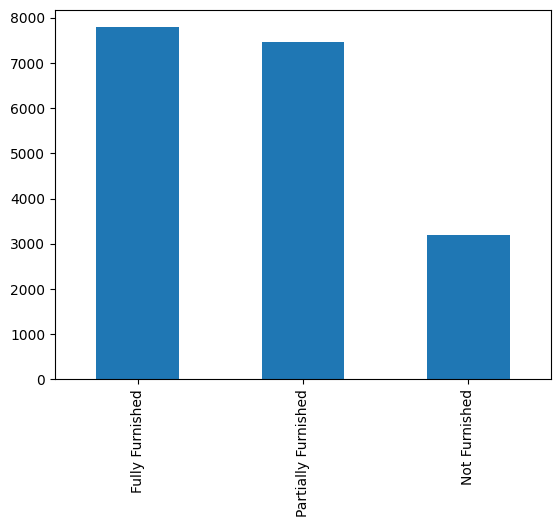

In [301]:
df2['furnished'].value_counts().plot(kind= 'bar')

In [302]:
def fur(x):
    try:
       return x.split(' ')[0]
    except:
        return np.nan

In [303]:

df2['furnished']= df2['furnished'].apply(fur)
df2['furnished']

0            Fully
1        Partially
2            Fully
3        Partially
4              Not
           ...    
19986    Partially
19987    Partially
19988    Partially
19989        Fully
19990    Partially
Name: furnished, Length: 18450, dtype: object

In [304]:
## for property_type feature
df2['property_type'].unique()

array(['Condominium', 'Apartment', 'Service Residence', 'Studio', 'Flat',
       'Duplex', 'Others', 'Townhouse Condo',
       'Condo / Services residence / Penthouse / Townhouse',
       'Residential', 'Bungalow House', 'Houses', 'Soho'], dtype=object)

In [305]:
df2['property_type'].value_counts()

Condominium                                           7713
Service Residence                                     4910
Apartment                                             4905
Flat                                                   550
Studio                                                 176
Others                                                  84
Duplex                                                  74
Townhouse Condo                                         33
Condo / Services residence / Penthouse / Townhouse       1
Residential                                              1
Bungalow House                                           1
Houses                                                   1
Soho                                                     1
Name: property_type, dtype: int64

<Axes: >

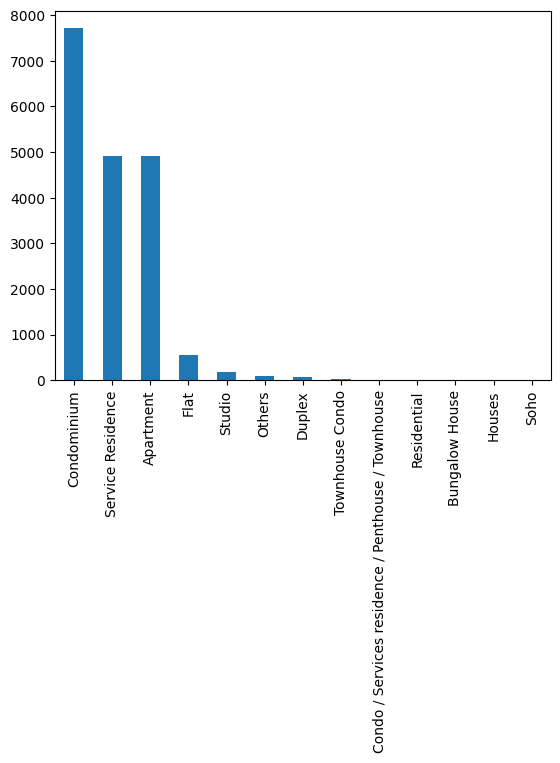

In [306]:
df2['property_type'].value_counts().plot(kind= 'bar')

In [307]:
def prop(x):
    try:
       return x.split(' ')[0]
    except:
        return np.nan

In [308]:
df2['property_type']= df2['property_type'].apply(prop)
df2['property_type']

0        Condominium
1        Condominium
2          Apartment
3          Apartment
4            Service
            ...     
19986      Apartment
19987        Service
19988    Condominium
19989        Service
19990         Studio
Name: property_type, Length: 18450, dtype: object

In [309]:
df2['property_type'].value_counts()

Condominium    7713
Service        4910
Apartment      4905
Flat            550
Studio          176
Others           84
Duplex           74
Townhouse        33
Condo             1
Residential       1
Bungalow          1
Houses            1
Soho              1
Name: property_type, dtype: int64

In [310]:
## for Facilioties feature
df2['facilities'].unique()

array(['Minimart, Gymnasium, Security, Playground, Swimming Pool, Parking, Lift, Barbeque area, Multipurpose hall, Jogging Track',
       'Playground, Parking, Barbeque area, Security, Jogging Track, Swimming Pool, Gymnasium, Lift, Sauna',
       'Minimart, Jogging Track, Lift, Swimming Pool', ...,
       'Gymnasium, Minimart, Playground, Sauna, Swimming Pool, Squash Court, Lift, Parking, Security, Barbeque area, Multipurpose hall',
       'Security, Parking, Lift, Minimart, Multipurpose hall, Playground, Jogging Track',
       'Jogging Track, Barbeque area, Playground, Swimming Pool, Tennis Court, Sauna'],
      dtype=object)

In [311]:
df2['prop_name'].unique()

array(['The Hipster @ Taman Desa', 'Segar Courts',
       'Pangsapuri Teratak Muhibbah 2', ...,
       'Pangsapuri Desa Mas Taman Desa Mas Bandar Country Homes',
       'Pangsapuri Meru Ehsan', 'Residensi Lili'], dtype=object)

In [312]:
df2['prop_name'].value_counts()

Majestic Maxim                         182
Platinum Splendor Residensi Semarak    145
M Centura                              111
M Vertica                              109
Lakefront Homes @ Cyberjaya             91
                                      ... 
Hampshire Place                          1
The Nest Residence                       1
Plaza 393                                1
Sri Harmonis Apartment Gombak            1
Residensi Lili                           1
Name: prop_name, Length: 2826, dtype: int64

#### `Adjusted the No of Rooms dtypes and extracting the numbers`

In [313]:
df2['rooms'].unique()

array(['5', '3', '2', '1', '4', '7', '6', 'More than 10', nan, '9', '3.0',
       '4.0', '2.0', '1.0', '5.0', '9.0', '6.0', '7.0', '10.0'],
      dtype=object)

In [314]:
df2['rooms'].value_counts()

3.0             5986
3               5803
2               1664
2.0             1397
1.0             1365
4                841
1                810
4.0              451
5                 54
5.0               38
6                 18
7                  6
6.0                4
More than 10       2
7.0                2
9                  1
9.0                1
10.0               1
Name: rooms, dtype: int64

In [315]:
df2.loc[df2['rooms'] == 'More than 10', 'rooms']= 11
df2['rooms']= pd.to_numeric(df2['rooms'], errors= 'coerce')
df2['rooms']

0        5.0
1        3.0
2        3.0
3        2.0
4        1.0
        ... 
19986    3.0
19987    4.0
19988    3.0
19989    3.0
19990    1.0
Name: rooms, Length: 18450, dtype: float64

In [316]:
df2['rooms'].value_counts()

3.0     11789
2.0      3061
1.0      2175
4.0      1292
5.0        92
6.0        22
7.0         8
11.0        2
9.0         2
10.0        1
Name: rooms, dtype: int64

<Axes: >

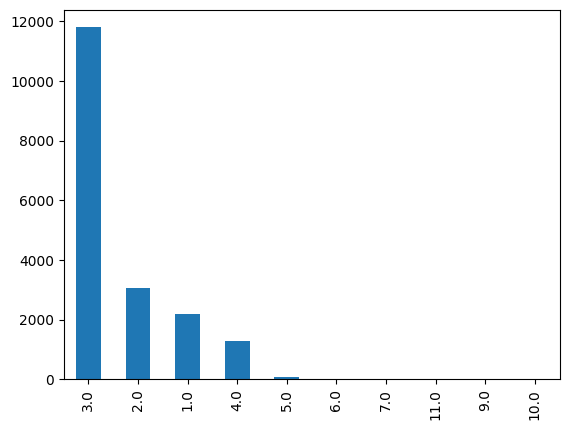

In [317]:
df2['rooms'].value_counts().plot(kind= 'bar')

In [318]:
ids_wrong = df2[df2['rooms']== 10.0].index.tolist()
df2.drop(index=ids_wrong, axis=0, inplace=True)

<Axes: >

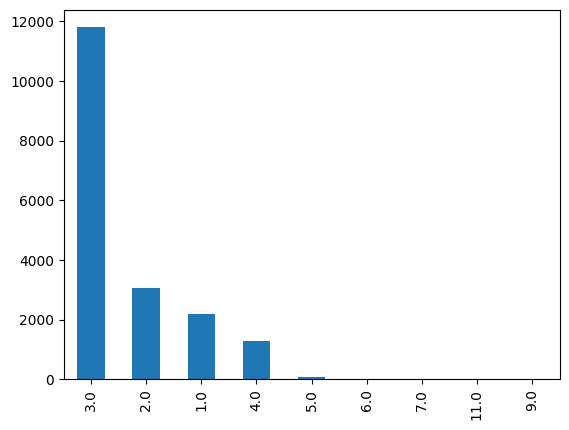

In [319]:
df2['rooms'].value_counts().plot(kind= 'bar')

In [320]:
## Check the parkibng
df['parking'].value_counts()

1.0     8644
2.0     5427
3.0      179
4.0       23
10.0       6
5.0        6
6.0        2
9.0        1
7.0        1
Name: parking, dtype: int64

<Axes: >

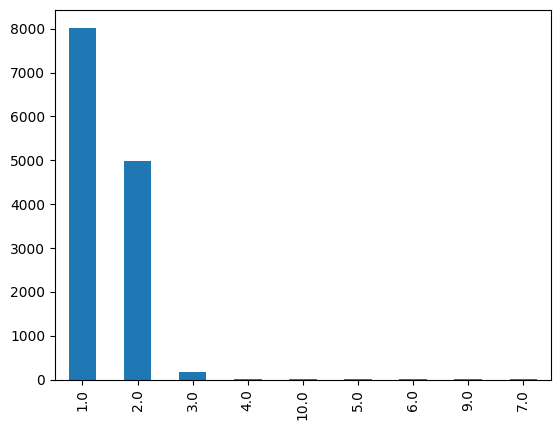

In [321]:
df2['parking'].value_counts().plot(kind= 'bar')

<Axes: >

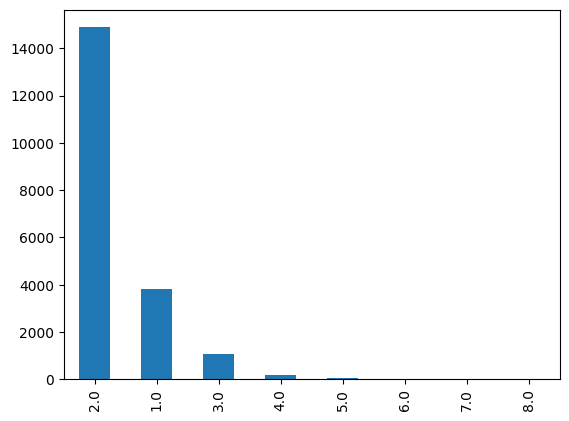

In [322]:
## Check for bathrooms
df['bathroom'].value_counts().plot(kind= 'bar')

In [323]:
df['bathroom'].value_counts()

2.0    14887
1.0     3800
3.0     1065
4.0      160
5.0       54
6.0        9
7.0        7
8.0        3
Name: bathroom, dtype: int64

### `Adjsuting completion year `

In [324]:

df2['completion_year']= df2['completion_year'].apply(np.round).astype('Int64')
df2['completion_year']

0        2022
1        <NA>
2        <NA>
3        2020
4        <NA>
         ... 
19986    <NA>
19987    2018
19988    <NA>
19989    <NA>
19990    2016
Name: completion_year, Length: 18449, dtype: Int64

<Axes: >

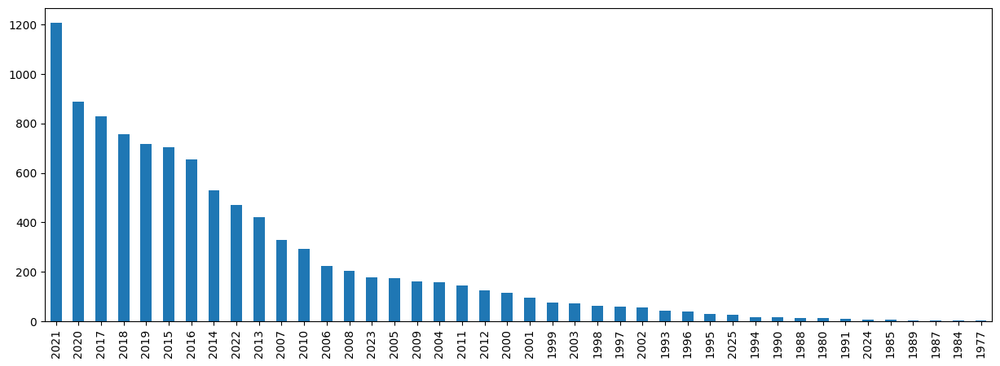

In [325]:
## Completion year analysis
df2['completion_year'].value_counts().plot(kind= 'bar', figsize=(15,5))

In [326]:
df2['completion_year'].value_counts()

2021    1207
2020     887
2017     830
2018     755
2019     718
2015     704
2016     653
2014     528
2022     471
2013     419
2007     330
2010     292
2006     224
2008     205
2023     177
2005     175
2009     159
2004     158
2011     144
2012     125
2000     114
2001      96
1999      76
2003      73
1998      63
1997      58
2002      56
1993      41
1996      39
1995      29
2025      27
1994      16
1990      15
1988      14
1980      11
1991       8
2024       7
1985       6
1989       4
1987       3
1984       1
1977       1
Name: completion_year, dtype: Int64

### `removing RM from monthly rent and convert to float`


In [327]:
df['monthly_rent']=df['monthly_rent'].str.replace(' ','')
df['monthly_rent']

0        RM4200permonth
1        RM2300permonth
2        RM1000permonth
3        RM1700permonth
4        RM1299permonth
              ...      
19986    RM1200permonth
19987    RM1300permonth
19988    RM1350permonth
19989    RM1200permonth
19990    RM1000permonth
Name: monthly_rent, Length: 19991, dtype: object

In [328]:
df2['monthly_rent'] = df2['monthly_rent'].str.replace('\D+', '')
df2['monthly_rent']=df2['monthly_rent'].astype(float)
df2['monthly_rent']

C:\Users\Omar\AppData\Local\Temp\ipykernel_11984\2659911374.py:1: FutureWarning:

The default value of regex will change from True to False in a future version.



0        4200.0
1        2300.0
2        1000.0
3        1700.0
4        1299.0
          ...  
19986    1200.0
19987    1300.0
19988    1350.0
19989    1200.0
19990    1000.0
Name: monthly_rent, Length: 18449, dtype: float64

### dropping kuala lumpur from the location


In [329]:
df2['district'] = df2['location'].apply(lambda x: re.findall("\w+$", x))[:]
df2.explode('district')
L3=[]
for i in range(df2.shape[0]):
        try:
             L3.append(df2['district'][i][0])
        except:
             L3.append(np.nan)

df2['district']= np.array(L3)
df2['district']


0             Desa
1           Cheras
2             Desa
3           Sentul
4            Kiara
           ...    
19986    Cyberjaya
19987         Jaya
19988    Kembangan
19989         Jaya
19990    Cyberjaya
Name: district, Length: 18449, dtype: object

In [330]:
df2['district']

0             Desa
1           Cheras
2             Desa
3           Sentul
4            Kiara
           ...    
19986    Cyberjaya
19987         Jaya
19988    Kembangan
19989         Jaya
19990    Cyberjaya
Name: district, Length: 18449, dtype: object

In [331]:
df2['district'].value_counts()

Cheras      1956
nan         1380
Alam        1048
Setapak      889
Kajang       777
            ... 
Penchala       1
43             1
369            1
Botanic        1
Garang         1
Name: district, Length: 101, dtype: int64

<Axes: >

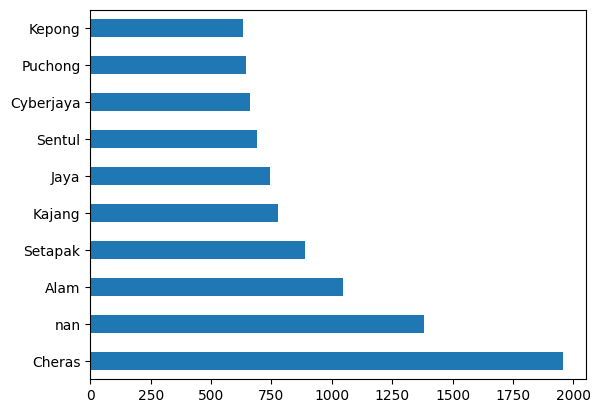

In [332]:
df2['district'].value_counts().head(10).plot(kind= 'barh')

<Axes: xlabel='district', ylabel='monthly_rent'>

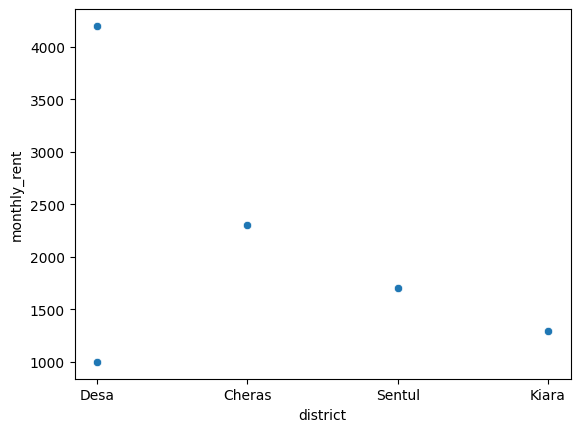

In [333]:
sns.scatterplot(x=df2['district'].head(5),y=df2['monthly_rent'])

#  <span style='color:green '> Step02-- Feature Engineering </span>

In [334]:
# For Facilies feature---->> convert the facilities to numbers by counting them
df2['facilities']= df2['facilities'].str.lower()
df2['facilities']

0        minimart, gymnasium, security, playground, swi...
1        playground, parking, barbeque area, security, ...
2             minimart, jogging track, lift, swimming pool
3        parking, playground, swimming pool, squash cou...
4        parking, security, lift, swimming pool, playgr...
                               ...                        
19986    security, parking, lift, minimart, multipurpos...
19987    jogging track, barbeque area, playground, swim...
19988    parking, security, lift, swimming pool, playgr...
19989    parking, security, lift, swimming pool, playgr...
19990    parking, security, lift, swimming pool, playgr...
Name: facilities, Length: 18449, dtype: object

In [335]:
def u(x):
     
     try:
         return len(x.split(','))
     except:
          return np.nan


    

In [336]:
df2['no_of_facilities']=df2['facilities'].apply(u)
df2['no_of_facilities']

0        10.0
1         9.0
2         4.0
3         8.0
4        11.0
         ... 
19986     7.0
19987     6.0
19988     7.0
19989    14.0
19990    14.0
Name: no_of_facilities, Length: 18449, dtype: float64

In [337]:
# Drop the Facilities Feature
df2.drop(columns=['facilities'], axis=1, inplace=True)

In [338]:
## For additional facilities
## For Additionnal Faciclities
df2['additional_facilities']= df2['additional_facilities'].str.lower()
def u(x):
     
     try:
         return len(x.split(','))
     except:
          return np.nan


df2['no_of_additional_facilities']=df2['additional_facilities'].apply(u)
df2['no_of_additional_facilities']

0        3.0
1        3.0
2        NaN
3        3.0
4        1.0
        ... 
19986    1.0
19987    2.0
19988    3.0
19989    2.0
19990    3.0
Name: no_of_additional_facilities, Length: 18449, dtype: float64

In [339]:
# Drop the Additional Facilities Feature
df2.drop(columns=['additional_facilities'], axis=1, inplace=True)

<Axes: >

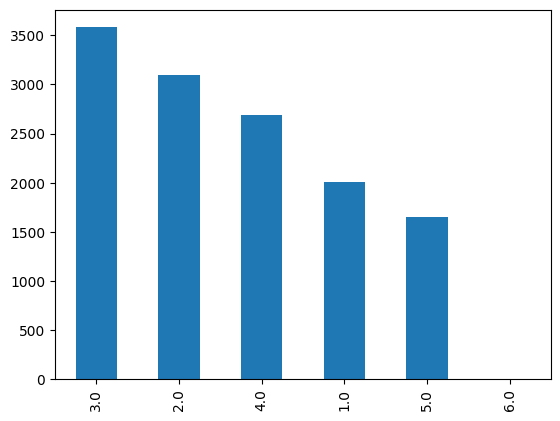

In [340]:
df2['no_of_additional_facilities'].value_counts().plot(kind='bar')
## The Most rental apartements have 3  additional facilities

<Axes: >

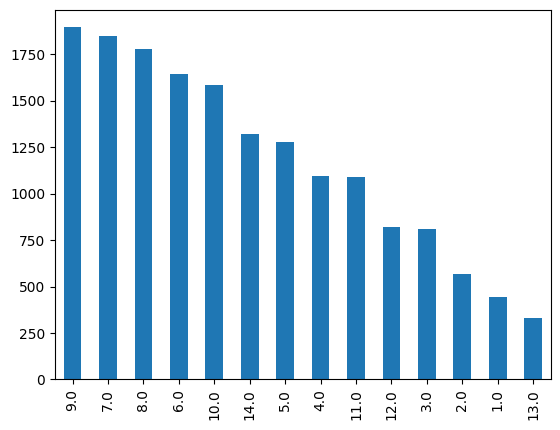

In [341]:
df2['no_of_facilities'].value_counts().plot(kind='bar')
## The Most rental apartements have 9 facilities

####  `adjusted the size to float and convert the sq.ft to sq.mete`

In [342]:
## adjusting Size datatype and removed the sq.ft
def sizing(x):
    try:
          return float(x.split(' ')[0])/10.764
    except:
         return np.nan


In [343]:
df2['size in sq.meter']= df2['size'].apply(sizing)


<Axes: >

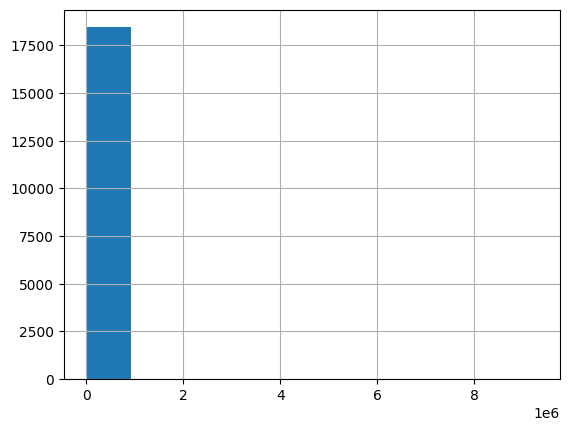

In [344]:
df2['size in sq.meter'].hist()

In [345]:
df2['size in sq.meter'].min(), df2['size in sq.meter'].max()

(0.0929022668153103, 9290226.588628763)

In [346]:
df2['size in sq.meter'][df2['size in sq.meter']==df2['size in sq.meter'].min()].value_counts(),df2['size in sq.meter'][df2['size in sq.meter']==df2['size in sq.meter'].min()].value_counts()

(0.092902    8
 Name: size in sq.meter, dtype: int64,
 0.092902    8
 Name: size in sq.meter, dtype: int64)

In [347]:
ids_wrong = df2[(df2['size in sq.meter']<=df2['size in sq.meter'].min()) | (df2['size in sq.meter']>=df2['size in sq.meter'].max())].index.tolist()
df2.drop(index=ids_wrong, axis=0, inplace=True)

In [348]:
fig = px.box(df2, y=df2['size in sq.meter'])
fig.show()

<Axes: >

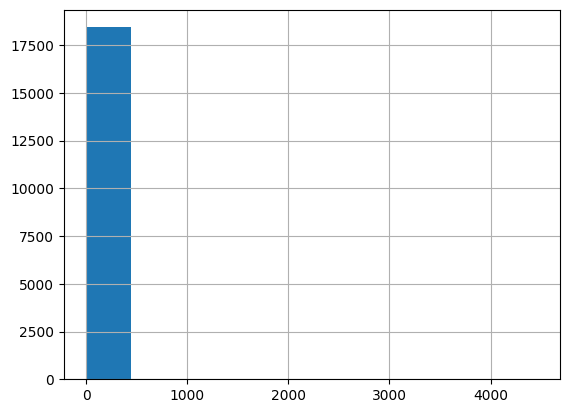

In [349]:
df2['size in sq.meter'].hist()

In [350]:
# get monthly rent per m2
df2['rent_per_m2']= df2['monthly_rent']/df2['size in sq.meter']
df2['rent_per_m2']

0        24.543322
1        21.160000
2        16.560000
3        24.628264
4        28.304526
           ...    
19986    12.916800
19987     9.806027
19988    11.442047
19989    11.742545
19990    18.558621
Name: rent_per_m2, Length: 18440, dtype: float64

In [351]:
# 'rent_per_m2' in Cheras
rent_per_m2= (df2['rent_per_m2'][df2['district']== 'Cheras']).mean()
rent_per_m2

28.332635953136705

In [352]:
df2['rent_per_m2']

0        24.543322
1        21.160000
2        16.560000
3        24.628264
4        28.304526
           ...    
19986    12.916800
19987     9.806027
19988    11.442047
19989    11.742545
19990    18.558621
Name: rent_per_m2, Length: 18440, dtype: float64

#  <span style='color:green '> Step03-- Check nans </span>

In [353]:
df2.isna().sum().sort_values(ascending= False)/ df2.shape[0]

completion_year                0.462310
no_of_additional_facilities    0.293818
parking                        0.284382
no_of_facilities               0.105694
prop_name                      0.049892
rooms                          0.000325
bathroom                       0.000325
furnished                      0.000271
monthly_rent                   0.000108
rent_per_m2                    0.000108
location                       0.000000
property_type                  0.000000
size                           0.000000
region                         0.000000
district                       0.000000
size in sq.meter               0.000000
dtype: float64

In [354]:
(df2.isna().sum().sort_values(ascending= False)/ df2.shape[0])*100

completion_year                46.231020
no_of_additional_facilities    29.381779
parking                        28.438178
no_of_facilities               10.569414
prop_name                       4.989154
rooms                           0.032538
bathroom                        0.032538
furnished                       0.027115
monthly_rent                    0.010846
rent_per_m2                     0.010846
location                        0.000000
property_type                   0.000000
size                            0.000000
region                          0.000000
district                        0.000000
size in sq.meter                0.000000
dtype: float64

<Axes: >

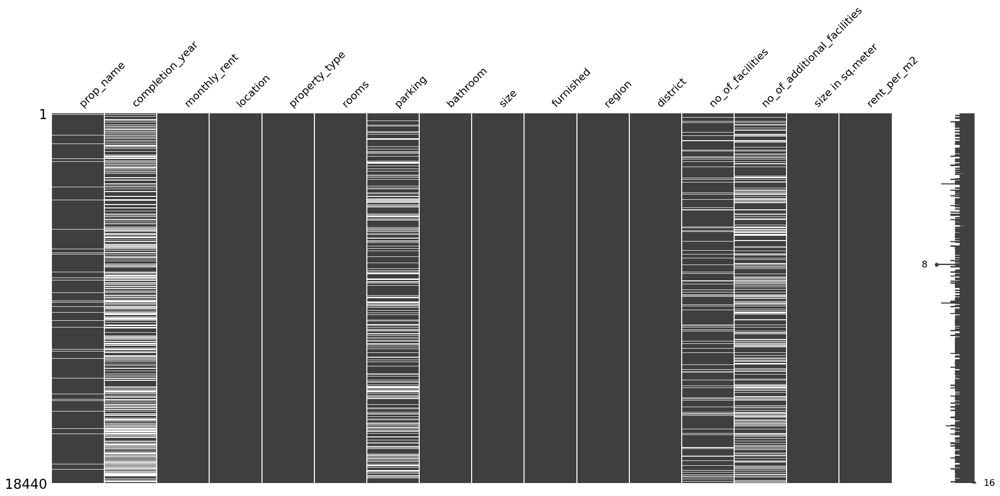

In [355]:
missingno.matrix(df2)


In [356]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18440 entries, 0 to 19990
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   prop_name                    17520 non-null  object 
 1   completion_year              9915 non-null   Int64  
 2   monthly_rent                 18438 non-null  float64
 3   location                     18440 non-null  object 
 4   property_type                18440 non-null  object 
 5   rooms                        18434 non-null  float64
 6   parking                      13196 non-null  float64
 7   bathroom                     18434 non-null  float64
 8   size                         18440 non-null  object 
 9   furnished                    18435 non-null  object 
 10  region                       18440 non-null  object 
 11  district                     18440 non-null  object 
 12  no_of_facilities             16491 non-null  float64
 13  no_of_additional

#  <span style='color:green '> Step04-->> Data Vizulization </span>

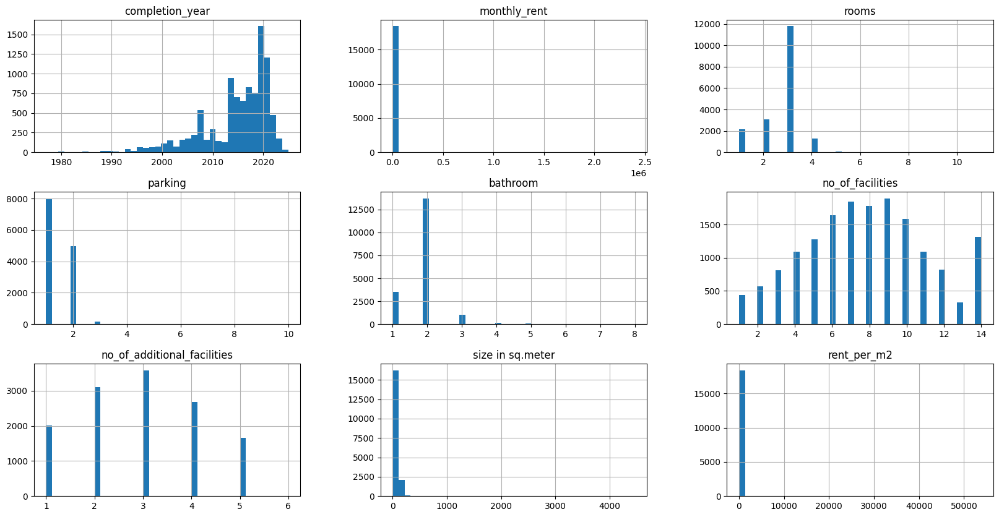

In [357]:
## numerical
df2.hist(bins=40, figsize=(20, 10))
plt.show()

 ### `Imputing outliers`

<Axes: >

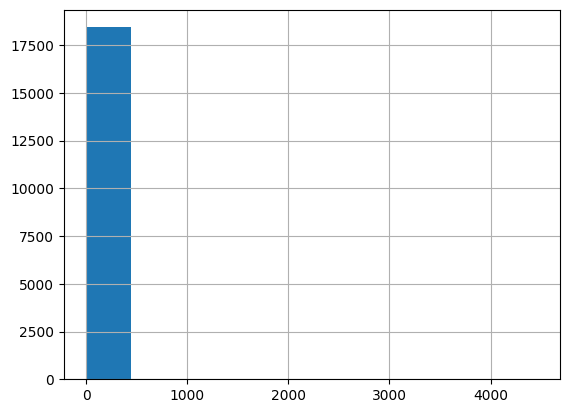

In [358]:

df2['size in sq.meter'].hist()

In [359]:
## Detect Outliers using datasist and impute using median
ids_outliers = detect_outliers(data=df2, n=0, features=['size in sq.meter'])
ids_outliers

[0,
 18,
 28,
 29,
 35,
 51,
 74,
 110,
 152,
 158,
 173,
 235,
 236,
 281,
 298,
 301,
 305,
 328,
 344,
 347,
 443,
 449,
 457,
 513,
 515,
 555,
 558,
 588,
 605,
 609,
 618,
 637,
 638,
 731,
 734,
 748,
 761,
 775,
 787,
 792,
 800,
 809,
 822,
 824,
 856,
 873,
 976,
 1000,
 1012,
 1020,
 1021,
 1036,
 1044,
 1054,
 1061,
 1067,
 1095,
 1096,
 1128,
 1134,
 1135,
 1182,
 1185,
 1212,
 1227,
 1233,
 1237,
 1244,
 1250,
 1264,
 1267,
 1294,
 1296,
 1315,
 1333,
 1365,
 1456,
 1458,
 1483,
 1487,
 1512,
 1513,
 1521,
 1597,
 1606,
 1640,
 1644,
 1655,
 1658,
 1685,
 1711,
 1716,
 1717,
 1728,
 1733,
 1756,
 1757,
 1759,
 1798,
 1805,
 1843,
 1846,
 1876,
 1933,
 1940,
 1970,
 1978,
 2000,
 2025,
 2052,
 2058,
 2066,
 2079,
 2085,
 2092,
 2096,
 2103,
 2139,
 2168,
 2179,
 2180,
 2214,
 2242,
 2249,
 2290,
 2322,
 2347,
 2362,
 2388,
 2410,
 2418,
 2488,
 2492,
 2515,
 2519,
 2549,
 2562,
 2563,
 2566,
 2567,
 2585,
 2597,
 2610,
 2617,
 2621,
 2622,
 2628,
 2680,
 2763,
 2764,
 2772

In [360]:
df2['size in sq.meter'][df2['size in sq.meter']<=10].sort_values(ascending=True)

14673    0.185805
12938    0.185805
15767    0.185805
5069     0.278707
8062     0.464511
17019    0.650316
13558    1.207729
6055     1.858045
513      1.858045
16991    2.322557
11827    3.716091
10281    4.645113
6765     5.016722
16057    5.481234
2418     5.574136
15345    7.432181
9143     7.432181
2242     7.432181
16343    7.896693
19260    8.175399
11812    8.361204
8495     9.290227
2798     9.290227
16197    9.290227
2103     9.290227
1716     9.290227
761      9.290227
17131    9.290227
17437    9.290227
18278    9.290227
18712    9.290227
18789    9.290227
18799    9.290227
18808    9.290227
19110    9.290227
16026    9.290227
8112     9.290227
3104     9.290227
3858     9.290227
8523     9.290227
6852     9.290227
6189     9.290227
11123    9.290227
6167     9.290227
19111    9.290227
3668     9.290227
6166     9.290227
5892     9.290227
13845    9.290227
14017    9.290227
14024    9.290227
14025    9.290227
14027    9.290227
12521    9.290227
17295    9.661836
Name: size

In [361]:
df2['size in sq.meter'][df2['size in sq.meter']>=800].sort_values(ascending=True)

2025     836.213304
4518    1393.534002
2622    4460.237830
Name: size in sq.meter, dtype: float64

In [362]:
idx01= df2['size in sq.meter'][(df2['size in sq.meter']>=800)|(df2['size in sq.meter']<=10)].index.tolist()
df2.drop(index=idx01, axis=0, inplace=True)

In [363]:
med_size= df2['size in sq.meter'].median()
med_size

82.86882199925678

<Axes: >

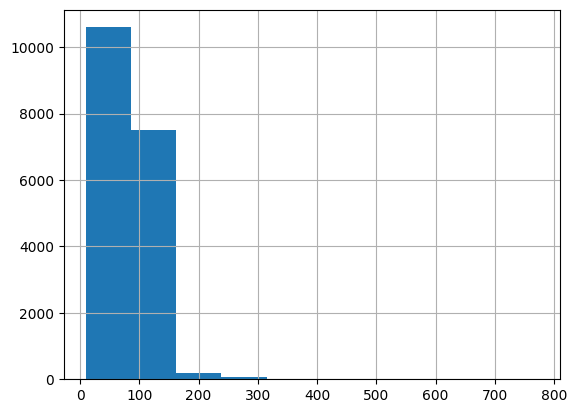

In [364]:
df2['size in sq.meter'].hist()

In [365]:
ids_outliers = detect_outliers(data=df2, n=0, features=['size in sq.meter'])
df2.loc[ids_outliers, 'size in sq.meter'] = df2['size in sq.meter'].median()

<Axes: >

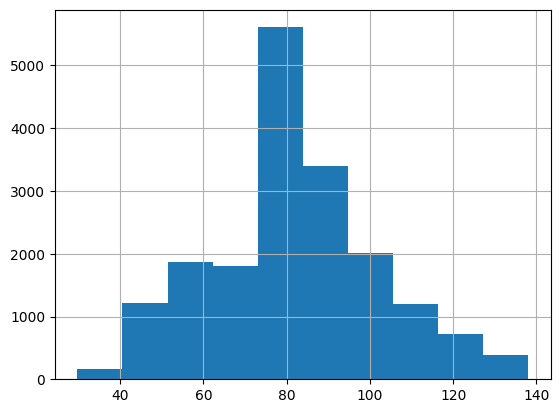

In [366]:

df2['size in sq.meter'].hist()

In [367]:
fig = px.box(df2, y=df2['size in sq.meter'])
fig.show()

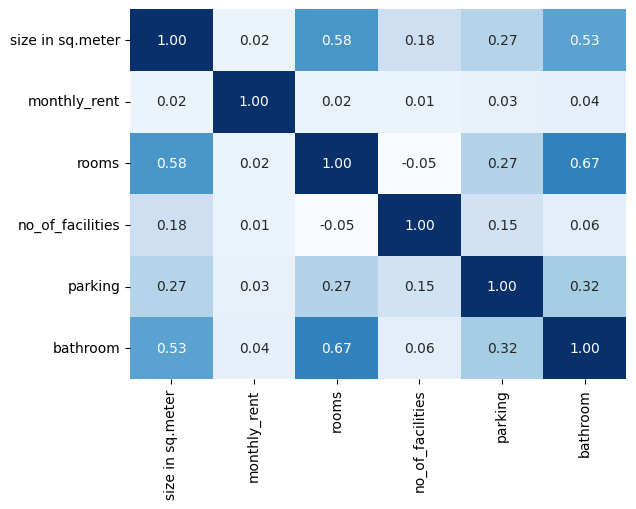

In [368]:
## Correlation
df_corr = df2[['size in sq.meter', 'monthly_rent', 'rooms', 'no_of_facilities','parking','bathroom']].corr()
sns.heatmap(df_corr, annot=True, cbar=False, fmt='.2f', cmap='Blues')
plt.show()

#  <span style='color:green '> Step04-- Bussinesss Understanding and data relations using data visulaization</span>

In [369]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18382 entries, 0 to 19990
Data columns (total 16 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   prop_name                    17472 non-null  object 
 1   completion_year              9891 non-null   Int64  
 2   monthly_rent                 18380 non-null  float64
 3   location                     18382 non-null  object 
 4   property_type                18382 non-null  object 
 5   rooms                        18379 non-null  float64
 6   parking                      13175 non-null  float64
 7   bathroom                     18379 non-null  float64
 8   size                         18382 non-null  object 
 9   furnished                    18378 non-null  object 
 10  region                       18382 non-null  object 
 11  district                     18382 non-null  object 
 12  no_of_facilities             16442 non-null  float64
 13  no_of_additional

* `Univariate Viz`

<Axes: >

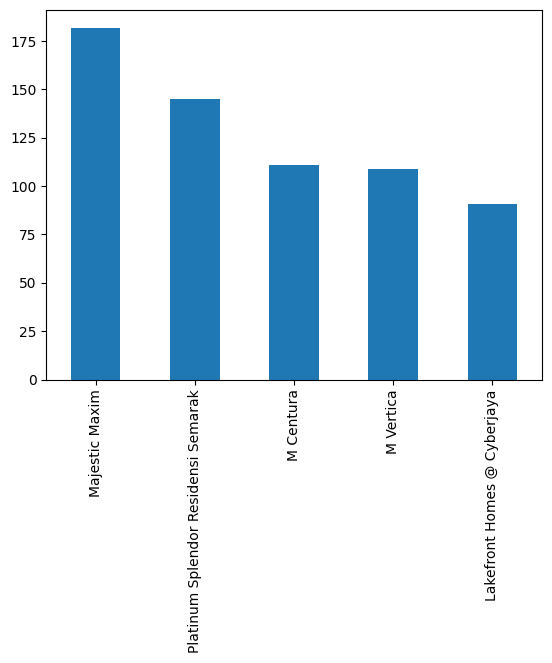

In [370]:
## What is the most renting prop in Malysia


df2['prop_name'].value_counts().head().plot(kind= 'bar')


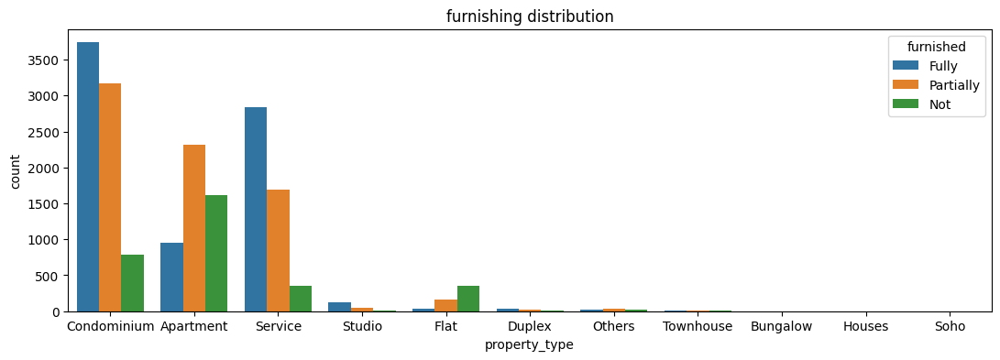

In [371]:
# What are the most furnished type accoring to each prop_type
fig = plt.figure(figsize = (13,4))
sns.countplot(x=df2['property_type'], hue=df2['furnished'])
df2.head()
plt.title('furnishing distribution')
plt.show()


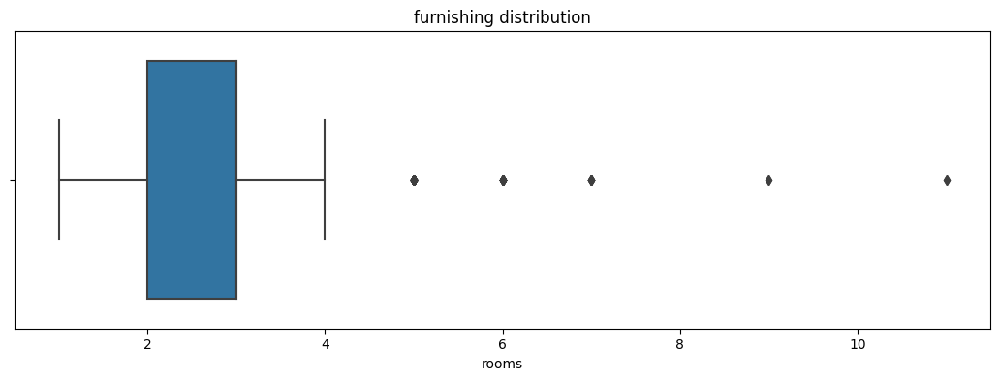

In [372]:
# What are the most furnished type accoring to each prop_type
fig = plt.figure(figsize = (13,4))
sns.boxplot(data=df2, x=df2['rooms'], hue=df2['furnished'])
df2.head()
plt.title('furnishing distribution')
plt.show()


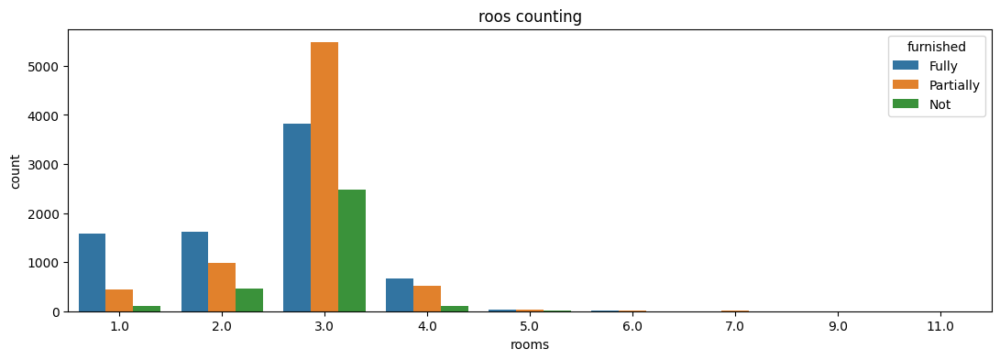

In [373]:
# wat are the most number of rooms renting according furnished element 
fig = plt.figure(figsize = (13,4))
sns.countplot(x=df2['rooms'], hue=df2['furnished'])
df2.head()
plt.title('roos counting')
plt.show()

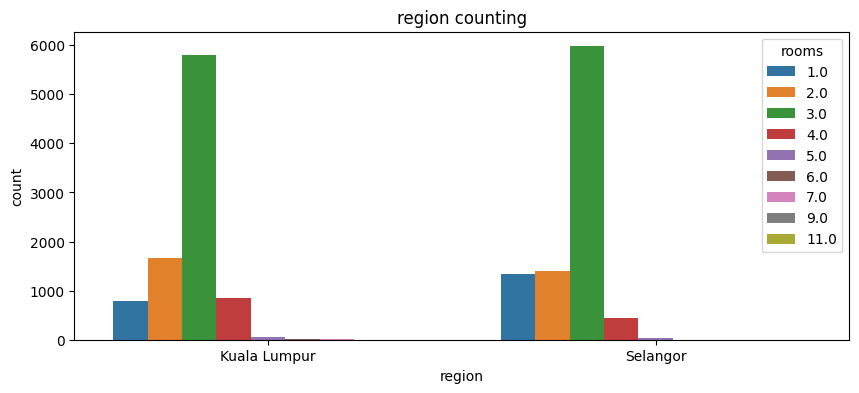

In [374]:
## at any region the most renting elements exist
fig = plt.figure(figsize = (10,4))
sns.countplot(x=df2['region'], hue=df2['rooms'])
df2.head()
plt.title('region counting')
plt.show()

In [375]:
## at any region the most renting size per meter distribution exist in each region
fig = px.box(df2, y=df2['size in sq.meter'], x=df2['region'])
fig.show()

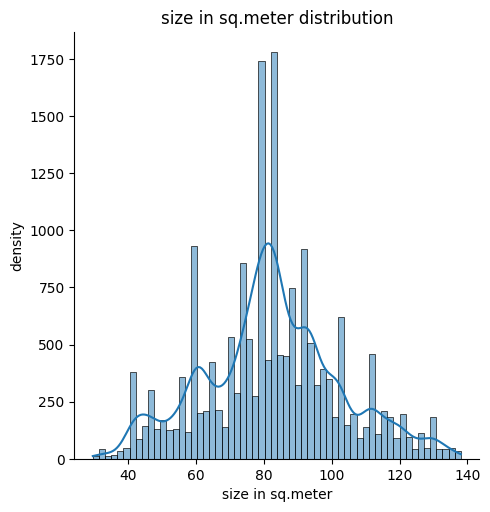

In [376]:
sns.displot(df2['size in sq.meter'], kde= True)
plt.title('size in sq.meter distribution')
plt.ylabel('density')
plt.xlabel('size in sq.meter')
plt.show()

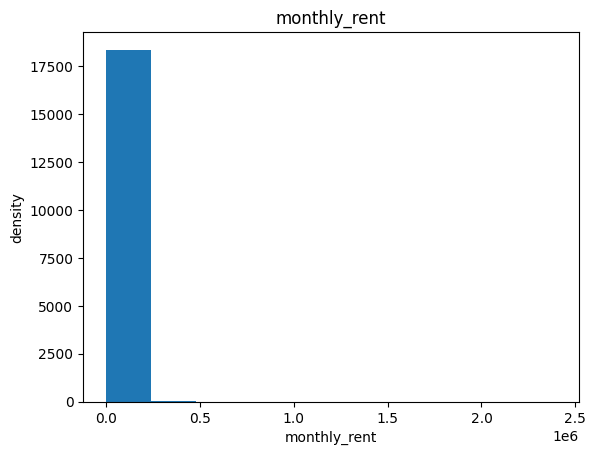

In [377]:
plt.hist(df2['monthly_rent'])
plt.title('monthly_rent')
plt.ylabel('density')
plt.xlabel('monthly_rent')
plt.show()

In [378]:
idx02= df2['monthly_rent'][df2['monthly_rent']>=5000].index.tolist()
df2.drop(index=idx02, axis=0, inplace=True)

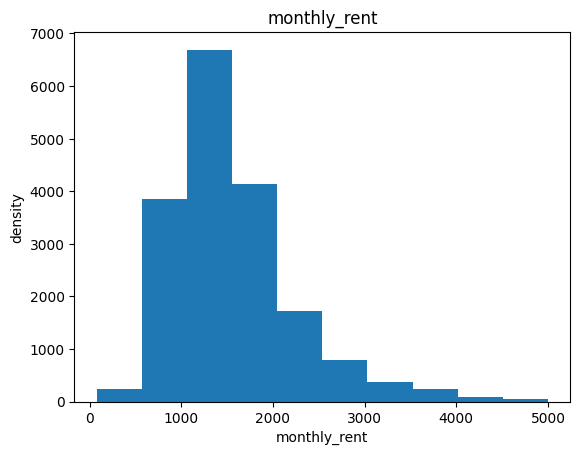

In [379]:
plt.hist(df2['monthly_rent'])
plt.title('monthly_rent')
plt.ylabel('density')
plt.xlabel('monthly_rent')
plt.show()

In [380]:
fig = px.box(df2, y=df2['monthly_rent'], x=df2['region'])
fig.show()

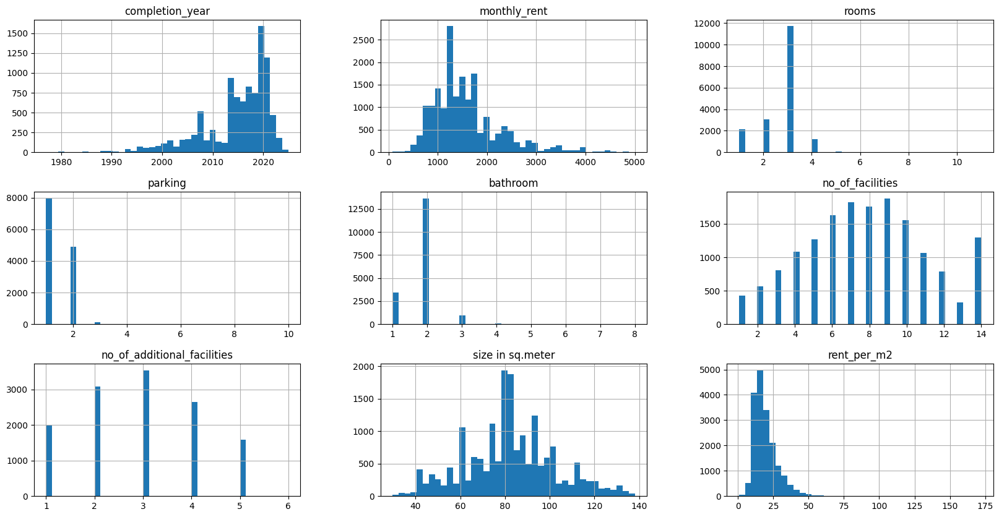

In [381]:
## numerical
df2.hist(bins=40, figsize=(20, 10))
plt.show()

* `Bivariate Viz`

In [382]:
px.scatter_matrix(df2, dimensions=['monthly_rent', 'rent_per_m2', 'size in sq.meter','rooms'], title='PairPlot for some Features')

In [383]:
# what is the relation between size and rent
px.scatter_matrix(df2, dimensions=['monthly_rent', 'size in sq.meter'])

In [384]:
# what is the rent_per_m2 in each region
fig = px.box(df2, y=df2['rent_per_m2'], x=df2['region'])
fig.show()

In [385]:
# what is the monthy_rent at each room numbers
fig = px.scatter(x='size in sq.meter', y='monthly_rent', data_frame=df2, marginal_x='violin', 
                title='ScatterPlot for size in sq.meter and monthly rent', 
                marginal_y='box', color='rooms')

fig.update_xaxes(title_text='size in sq.meter')
fig.update_yaxes(title_text='monthly_rent')
fig.show()

In [386]:
## show the box
px.violin(df2, x="property_type", y="monthly_rent", color="region", 
          title='ViolinPlot at different rooms with monthly rent', box=True)

In [387]:
px.histogram(df2, x='monthly_rent', color='rooms', facet_col='region', facet_col_wrap=2, nbins=30, 
             title='Histogram at different rooms according to monthly rent')

In [388]:
df2.columns

Index(['prop_name', 'completion_year', 'monthly_rent', 'location',
       'property_type', 'rooms', 'parking', 'bathroom', 'size', 'furnished',
       'region', 'district', 'no_of_facilities', 'no_of_additional_facilities',
       'size in sq.meter', 'rent_per_m2'],
      dtype='object')

In [389]:
# Does number of facility have an effect on the rent and have arelation with area
fig = px.scatter(x='size in sq.meter', y='monthly_rent', data_frame=df2, marginal_x='violin', 
                title='ScatterPlot for size in sq.meter and monthly rent', 
                marginal_y='box', color='no_of_facilities')

fig.update_xaxes(title_text='size in sq.meter')
fig.update_yaxes(title_text='monthly_rent')
fig.show()

In [390]:

fig1 = px.strip(df2, x='no_of_facilities', y='monthly_rent', color_discrete_sequence=['red'], 
              title='StripPlot & ViolinPlot of monthly rent  at different facilities')
fig2 = px.violin(df2, x='no_of_facilities', y='monthly_rent')

all_fig = go.Figure(data=fig1.data + fig2.data, layout=fig1.layout)  ## combine
all_fig.show()

In [391]:
px.box(df2, x="no_of_facilities", y="monthly_rent", points='all', title="Tips Distribution with boxPlot and StripPlot")

In [392]:
# Does number of additional facilities have an effect on the rent and have arelation with area
fig = px.scatter(x='size in sq.meter', y='monthly_rent', data_frame=df2, marginal_x='violin', 
                title='ScatterPlot for size in sq.meter and monthly rent', 
                marginal_y='box', color='no_of_additional_facilities')

fig.update_xaxes(title_text='size in sq.meter')
fig.show()

In [393]:
df2.drop(df2[['prop_name','location','district','size','rent_per_m2','no_of_additional_facilities']], axis=1, inplace=True)

In [394]:
## drop nans from the target
df2.dropna(subset=['monthly_rent'], axis=0, inplace=True)

In [395]:
(df2.isna().sum().sort_values(ascending= False)/ df2.shape[0])*100

completion_year     46.238451
parking             28.393093
no_of_facilities    10.608227
rooms                0.016498
bathroom             0.016498
furnished            0.010999
monthly_rent         0.000000
property_type        0.000000
region               0.000000
size in sq.meter     0.000000
dtype: float64

In [396]:
## drop the unity unique values in property type
idx03= df2[df2['property_type'].isin(['Condo','Residential','Bungalow','Houses','Soho'])].index.tolist()
df2.drop(index=idx03, axis=0, inplace= True)


#  <span style='color:green '> Step05-- split data set </span>

In [397]:
## split to faetures and target
X = df2.drop(columns=['monthly_rent'], axis=1)   ## faetures
y = df2['monthly_rent']   ## traget

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.35, shuffle=True, random_state=102)

print('X_train.shape \t', X_train.shape)
print('y_train.shape \t', y_train.shape)
print('***'*20)
print('X_test.shape \t', X_test.shape)
print('y_test.shape \t', y_test.shape)

X_train.shape 	 (11818, 9)
y_train.shape 	 (11818,)
************************************************************
X_test.shape 	 (6364, 9)
y_test.shape 	 (6364,)


#  <span style='color:green '> Step06-- Data Preprocessing </span>

### `Feature Transformations`

In [398]:
## Get the Numerical and Catgeorcial columns
num_cols = X_train.select_dtypes(include='number').columns.tolist()
categ_cols = X_train.select_dtypes(exclude='number').columns.tolist()

print('Numerical cols \t', num_cols)
print('Categorical cols \t', categ_cols)

Numerical cols 	 ['completion_year', 'rooms', 'parking', 'bathroom', 'no_of_facilities', 'size in sq.meter']
Categorical cols 	 ['property_type', 'furnished', 'region']


In [399]:
## Building pipeline

## 1- Numerical pipeline

## for the completion years Nans
## about 46% of the values are nan
## completion years--- median
## parking--- median             
## rooms-- median                  
## bathroom -- median 
num_pipeline = Pipeline(steps=[
                        ('selector', DataFrameSelector(num_cols)),
                        ('imputer', SimpleImputer(strategy='most_frequent')),
                        ('transform', PowerTransformer(method='yeo-johnson', standardize=True))
                ])


## Catgeorical pipeline
categ_pipeline = Pipeline(steps=[
                ('selector', DataFrameSelector(categ_cols)),
                ('imputer', SimpleImputer(strategy='most_frequent')),
                ('encoder', OrdinalEncoder())
               ])


## Combine all
all_pipe = FeatureUnion(transformer_list=[
                ('num', num_pipeline),
                ('categ', categ_pipeline)
            ])

## fit and transform
X_train_final = all_pipe.fit_transform(X_train)
X_test_final = all_pipe.transform(X_test)

c:\myanaconda\envs\ml2\Lib\site-packages\sklearn\preprocessing\_data.py:3256: RuntimeWarning:

overflow encountered in power

c:\myanaconda\envs\ml2\Lib\site-packages\numpy\core\_methods.py:239: RuntimeWarning:

overflow encountered in multiply

c:\myanaconda\envs\ml2\Lib\site-packages\numpy\core\_methods.py:250: RuntimeWarning:

overflow encountered in reduce



### `Building Models`

#### `1. Linear Regression`

In [400]:
## intialize 
lin_reg = LinearRegression()
lin_reg.fit(X_train_final, y_train)   ## train


## Predict and Evaluate Model
y_pred_train_lin = lin_reg.predict(X_train_final)    ## you have the true value for train data (y_train)
y_pred_test_lin = lin_reg.predict(X_test_final)       ## you have the true value for train data (y_test)


## Evaluate Model USING RMSE
rmse_train_lin = np.sqrt(mean_squared_error(y_train, y_pred_train_lin))
rmse_test_lin = np.sqrt(mean_squared_error(y_test, y_pred_test_lin))

print(f'RMSE of Training Dataset using LinearRegression Model is: {rmse_train_lin:.3f}')
print(f'RMSE of Testing Dataset using LinearRegression Model is: {rmse_test_lin:.3f}')      ## No Overfitting

RMSE of Training Dataset using LinearRegression Model is: 515.989
RMSE of Testing Dataset using LinearRegression Model is: 524.286


### `2. Polynomail Features`

In [401]:
## Use degree=2
poly = PolynomialFeatures(degree=2, include_bias=False)
## fitting and transforming
X_train_final2 = poly.fit_transform(X_train_final)
X_test_final2 = poly.transform(X_test_final)


## Ready for Model ---> Uing LinearRegression
## intialize 
poly_reg = LinearRegression()
poly_reg.fit(X_train_final2, y_train)   ## train

## Predict and Evaluate Model
y_pred_train_poly = poly_reg.predict(X_train_final2)    ## you have the true value for train data (y_train)
y_pred_test_poly = poly_reg.predict(X_test_final2)       ## you have the true value for train data (y_test)


## Evaluate Model USING RMSE
rmse_train_poly = np.sqrt(mean_squared_error(y_train, y_pred_train_poly))
rmse_test_poly = np.sqrt(mean_squared_error(y_test, y_pred_test_poly))

print(f'RMSE of Training Dataset using LinearRegression with PolynomailFetaures is: {rmse_train_poly:.3f}')
print(f'RMSE of Testing Dataset using LinearRegression with PolynomailFetaures is: {rmse_test_poly:.3f}')     ## No Overfitting.


RMSE of Training Dataset using LinearRegression with PolynomailFetaures is: 474.820
RMSE of Testing Dataset using LinearRegression with PolynomailFetaures is: 488.866


### `SGD`

In [402]:
## Using SGD with Early Stopping
sgd_reg = SGDRegressor(penalty=None, learning_rate='constant', eta0=0.0001, early_stopping=True, 
                       n_iter_no_change=5, validation_fraction=0.1)
sgd_reg.fit(X_train_final, y_train)   ## training

## Predict and Evaluate Model
y_pred_train_sgd = sgd_reg.predict(X_train_final)    ## you have the true value for train data (y_train)
y_pred_test_sgd = sgd_reg.predict(X_test_final)       ## you have the true value for train data (y_test)


## Evaluate Model USING RMSE
rmse_train_sgd = np.sqrt(mean_squared_error(y_train, y_pred_train_sgd))
rmse_test_sgd = np.sqrt(mean_squared_error(y_test, y_pred_test_sgd))

print(f'RMSE of Training Dataset using SGDRegression is: {rmse_train_sgd:.3f}')
print(f'RMSE of Testing Dataset using SGDRegression is: {rmse_test_sgd:.3f}')     

RMSE of Training Dataset using SGDRegression is: 516.068
RMSE of Testing Dataset using SGDRegression is: 524.391
